# Welcome To PokeBook:  A Window into the Extraordinary World of Pokémon!

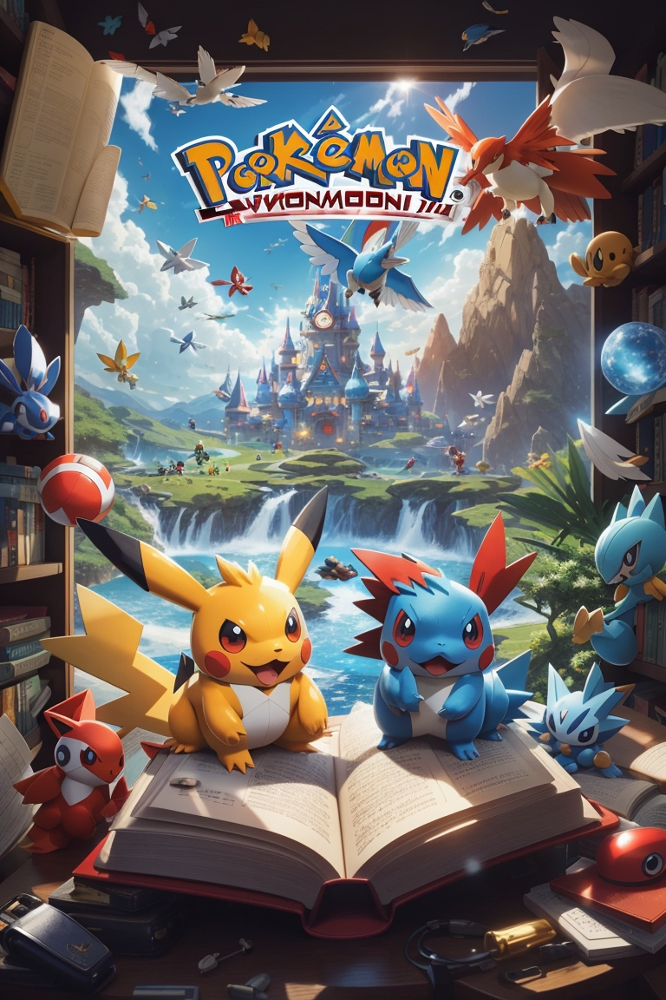

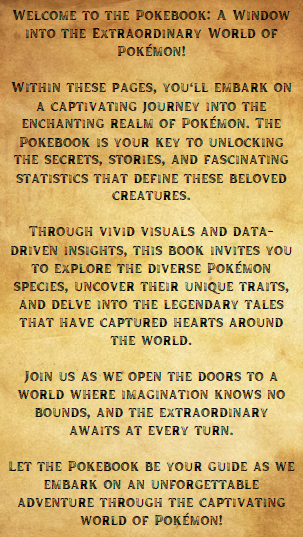

Our journey will be guided by the timeless wisdom and vast knowledge of Professor Lexicon, a revered expert in the field of Pokémon studies. With their guidance, we'll unravel the complexities of the Pokémon ecosystem, understanding the dynamics of battling, evolution, and the intricate web of relationships that shape this vibrant world.

But this guide goes beyond mere facts and figures. It is an invitation to experience the profound emotions that Pokémon evoke—a testament to the enduring power of friendship, determination, and the pursuit of dreams. Together, we'll celebrate the triumphs, navigate the challenges, and revel in the joys that come from immersing ourselves in this cherished universe.

So, dear reader, be prepared to embark on an epic odyssey. Let the Guide of Pokebook be your beacon, illuminating the path that leads to an extraordinary world of imagination, discovery, and boundless possibilities.

Ready your hearts, sharpen your senses, and step into the Pokémon world. Adventure awaits, and the Guide of Pokebook shall be your steadfast companion along this remarkable voyage of a lifetime.


## Meet Our Little Professor Lexicon

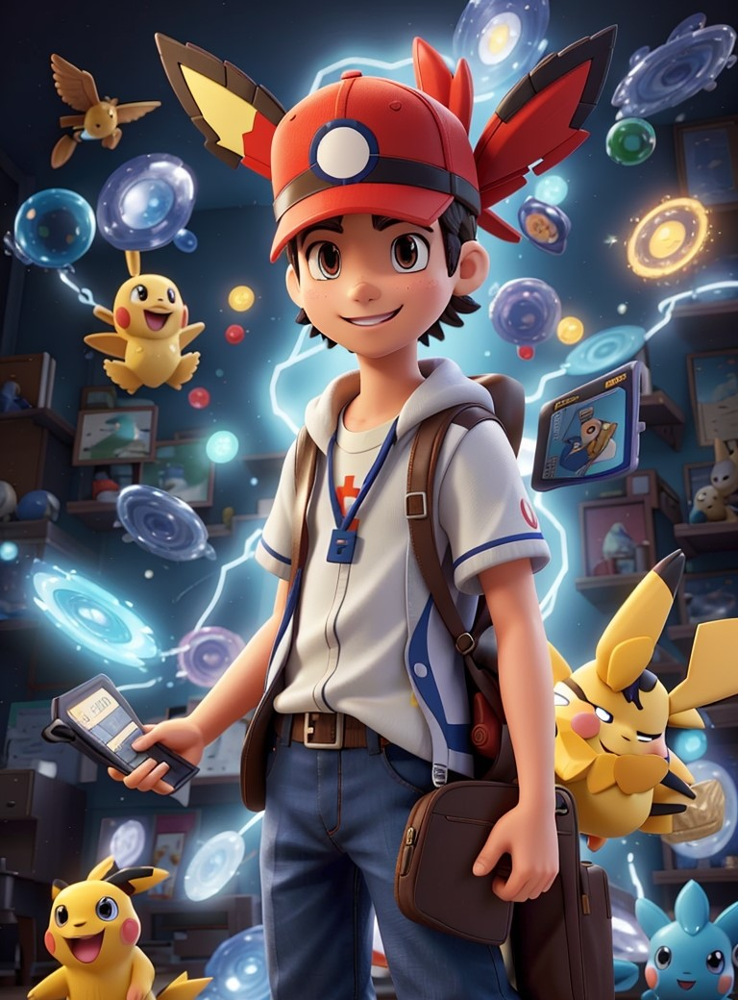

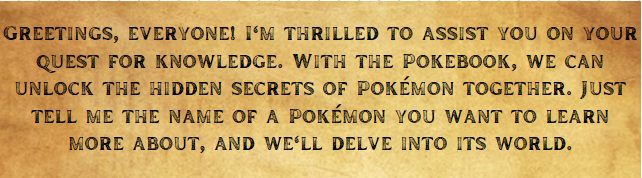

## Chapter 1: Introduction

In [6]:
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image
import seaborn as sns
import os
import numpy as np
import requests
import io

url = r'https://raw.githubusercontent.com/navdiya-nikunj/Pokemon_data_visulization/main/Dataset/pokemon.csv'
pokemon_data = pd.read_csv(url)
# pokemon_data = pd.read_csv(r"C:\Users\Nikunj\Downloads\Dataset\pokemon.csv")

In [7]:
pokemon_data

,Unnamed: 0,image_url,Id,Names,Type1,Type2,Total,HP,Attack,Defense,Sp. Atk,Sp. Def,Speed
0,0,https://img.pokemondb.net/sprites/sword-shield...,1,Bulbasaur,Grass,Poison,318,45,49,49,65,65,45
1,1,https://img.pokemondb.net/sprites/sword-shield...,2,Ivysaur,Grass,Poison,405,60,62,63,80,80,60
2,2,https://img.pokemondb.net/sprites/sword-shield...,3,Venusaur,Grass,Poison,525,80,82,83,100,100,80
3,3,https://img.pokemondb.net/sprites/sword-shield...,3,Venusaur Mega Venusaur,Grass,Poison,625,80,100,123,122,120,80
4,4,https://img.pokemondb.net/sprites/sword-shield...,4,Charmander,Fire,NaN,309,39,52,43,60,50,65
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1189,1189,https://img.pokemondb.net/sprites/scarlet-viol...,1006,Iron Valiant,Fairy,Fighting,590,74,130,90,120,60,116
1190,1190,https://img.pokemondb.net/sprites/scarlet-viol...,1007,Koraidon,Fighting,Dragon,670,100,135,115,85,100,135
1191,1191,https://img.pokemondb.net/sprites/scarlet-viol...,1008,Miraidon,Electric,Dragon,670,100,85,100,135,115,135
1192,1192,https://img.pokemondb.net/sprites/scarlet-viol...,1009,Walking Wake,Water,Dragon,590,99,83,91,125,83,109


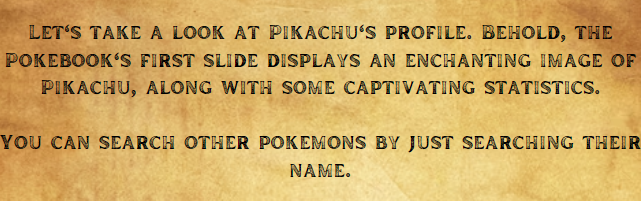

Please enter the name of a Pokémon: Bulbasaur


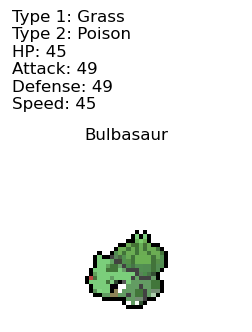

In [32]:
import requests
from io import BytesIO
def create_pokecard(pokemon_name):
    # Filter the dataset to find the requested Pokemon
    pokemon = pokemon_data.loc[pokemon_data['Names'] == pokemon_name.capitalize()]

    if pokemon.empty:
        print("Oops! Pokémon not found.")
        return

    # Retrieve relevant information
    name = pokemon['Names'].values[0]
    type1 = pokemon['Type1'].values[0]
    type2 = pokemon['Type2'].values[0]
    hp = pokemon['HP'].values[0]
    attack = pokemon['Attack'].values[0]
    defense = pokemon['Defense'].values[0]
    speed = pokemon['Speed'].values[0]
    image_url = pokemon['image_url'].values[0]

    # Load the image from the local directory
    #image = Image.open(r"https://img.pokemondb.net/sprites/sword-shield/icon/ivysaur.png")
    response = requests.get(image_url)
    image = Image.open(BytesIO(response.content))

    # Display the Pokecard
    plt.figure(figsize=(3, 3))
    plt.imshow(image)
    plt.title(name.capitalize())
    plt.axis('off')
    plt.text(0, -10, f"Type 1: {type1}\nType 2: {type2}\nHP: {hp}\nAttack: {attack}\nDefense: {defense}\nSpeed: {speed}",
             fontsize=12, ha='left')

    # Show the Pokecard
    plt.show()

# Prompt the user for a Pokémon name
pokemon_name = input("Please enter the name of a Pokémon: ")

# Create and display the Pokecard
create_pokecard(pokemon_name)

## Chapter 2: Stats analysis

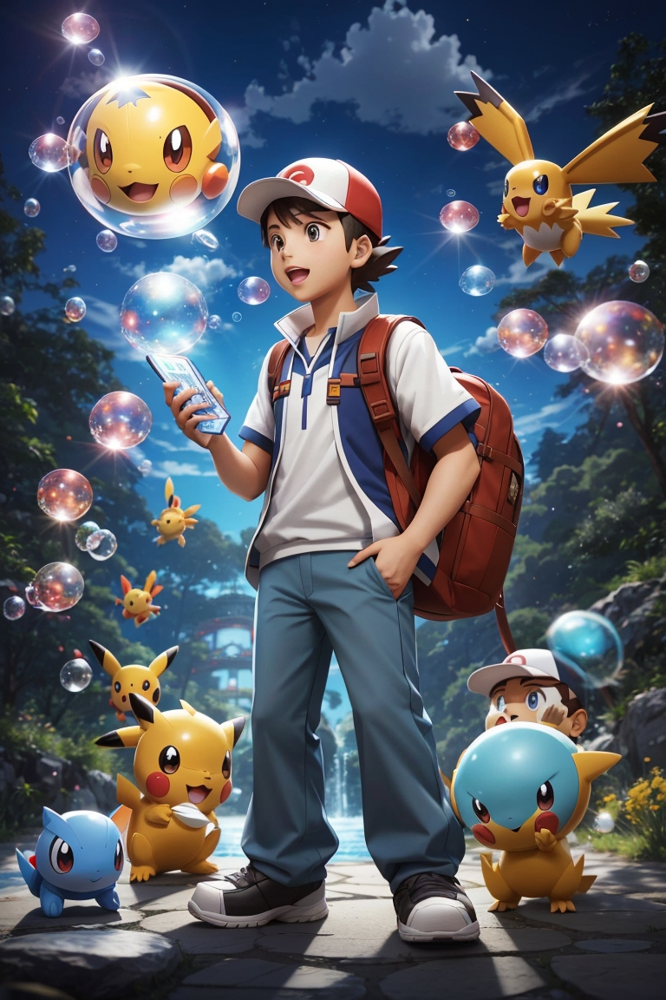

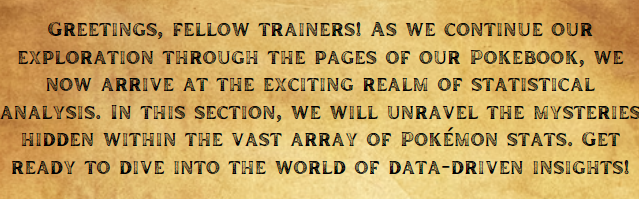

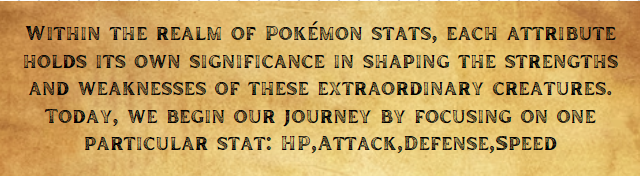

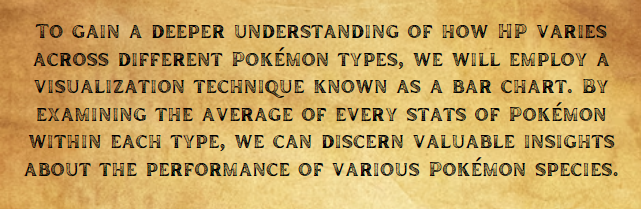

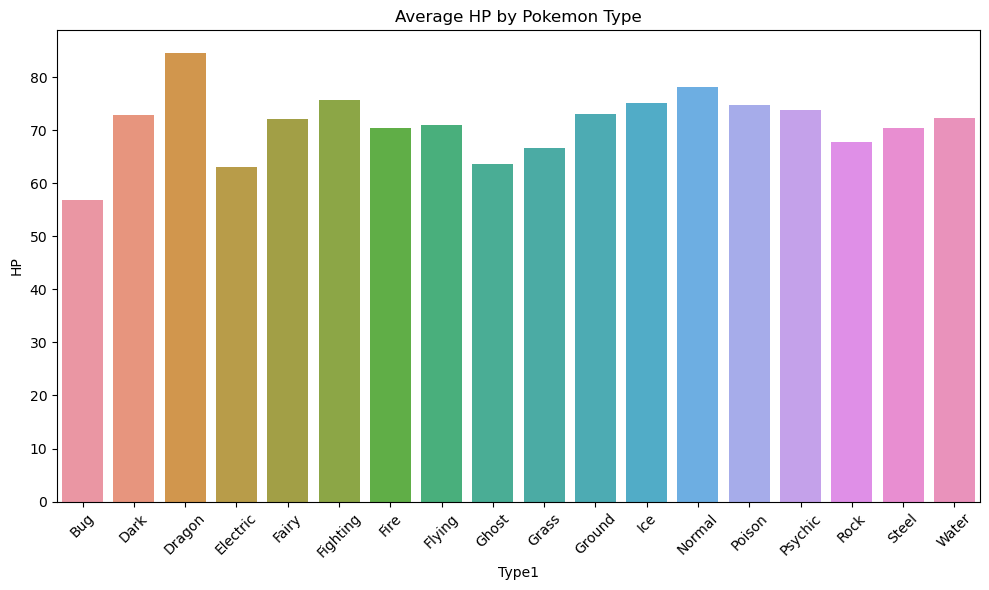

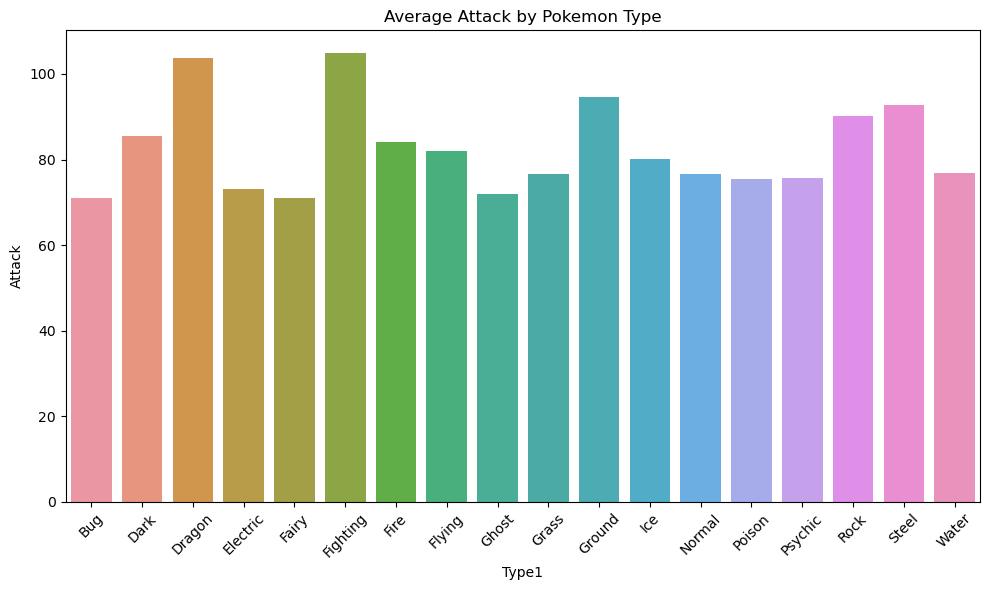

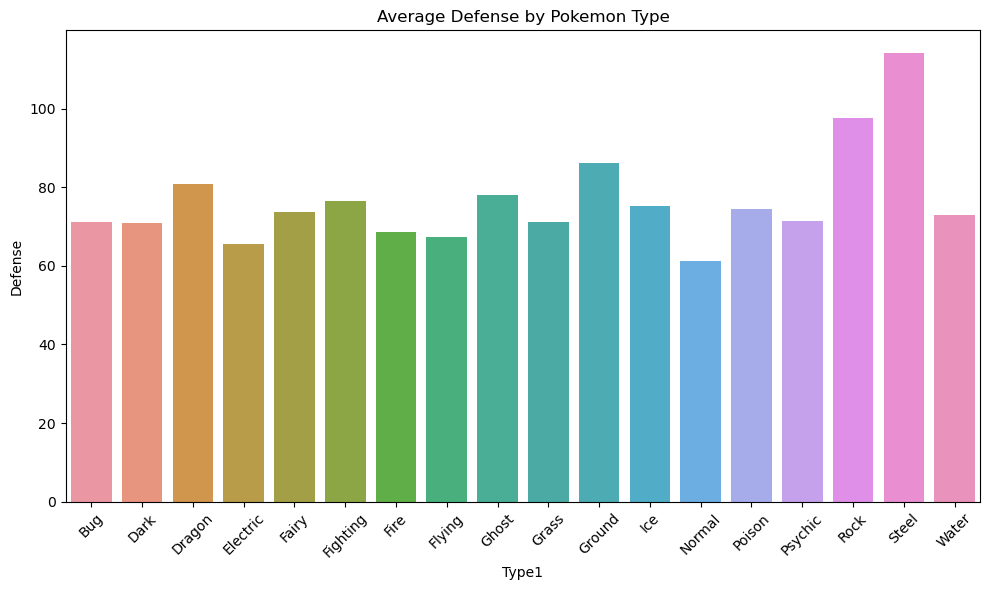

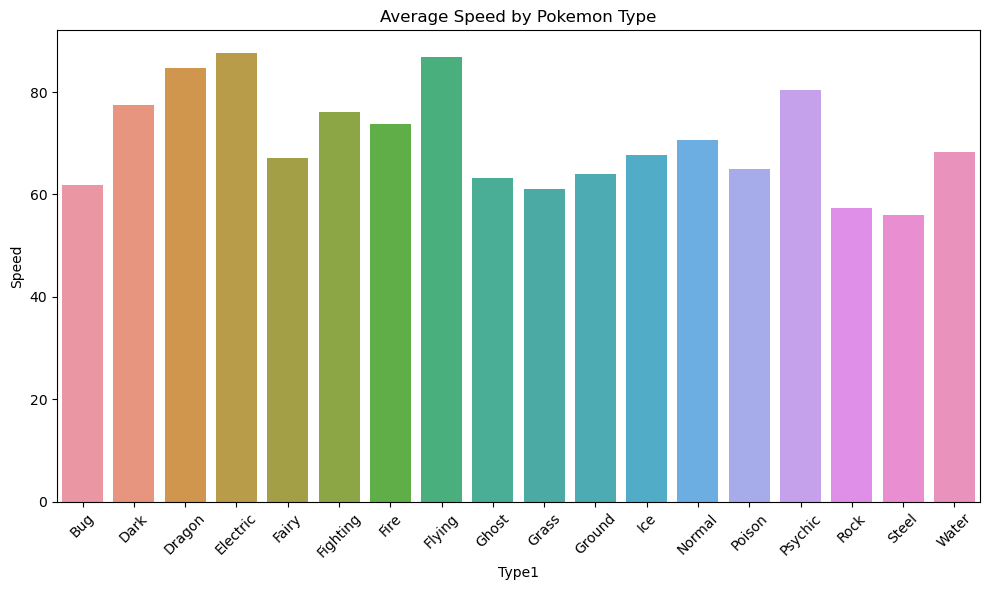

In [33]:

def analyze_pokemon_stats():
    # Extract the desired stats from the dataset
    stats = ['HP', 'Attack', 'Defense', 'Speed']
    pokemon_stats = pokemon_data[stats]

    # Create bar charts to compare average stats by type
    average_stats_by_type = pokemon_data.groupby('Type1')[stats].mean().reset_index()
    for stat in stats:
        plt.figure(figsize=(10, 6))
        sns.barplot(data=average_stats_by_type, x='Type1', y=stat)
        plt.title(f'Average {stat} by Pokemon Type')
        plt.xticks(rotation=45)
        plt.tight_layout()
        plt.show()

# Analyze the Pokemon stats
analyze_pokemon_stats()


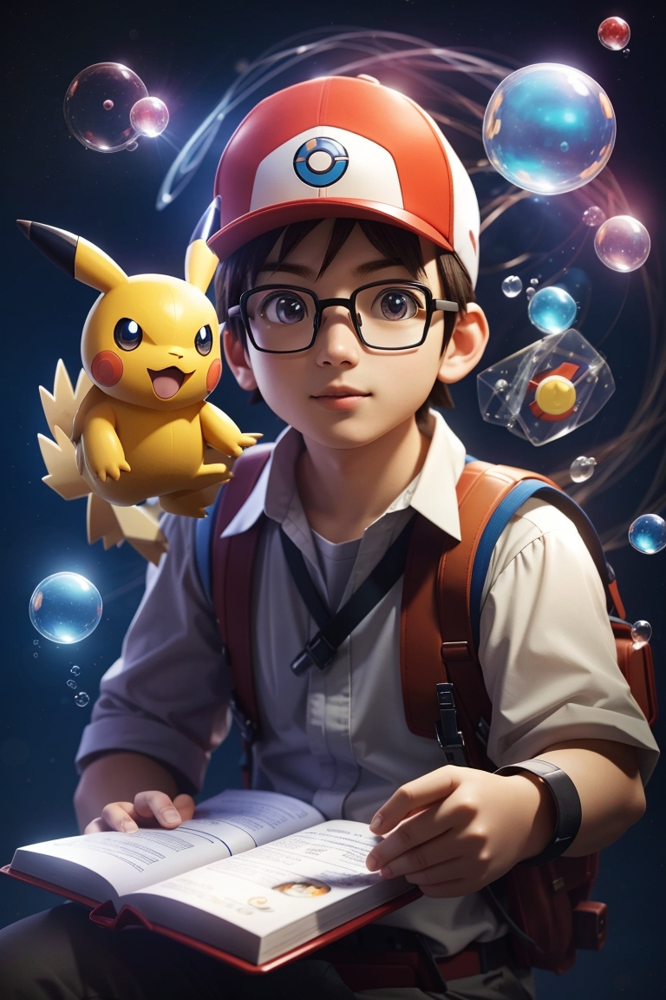

### Let's Discuss Insights of all the bar charts

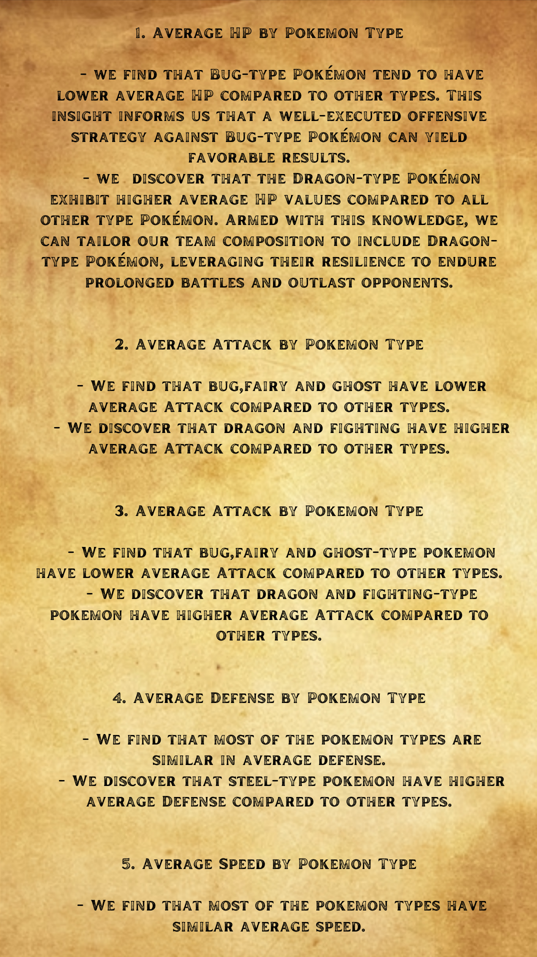

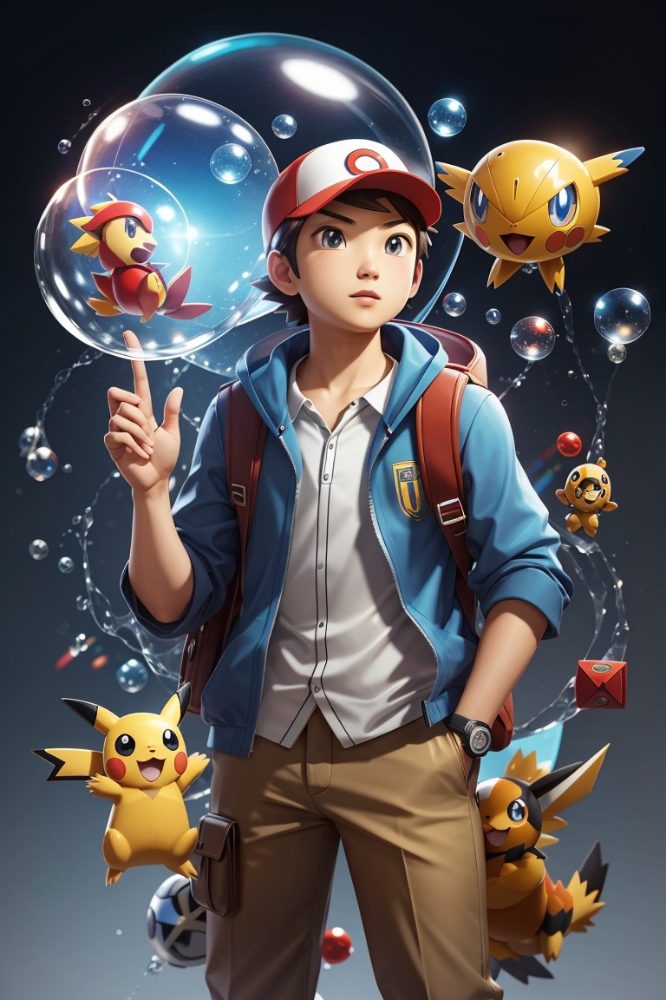

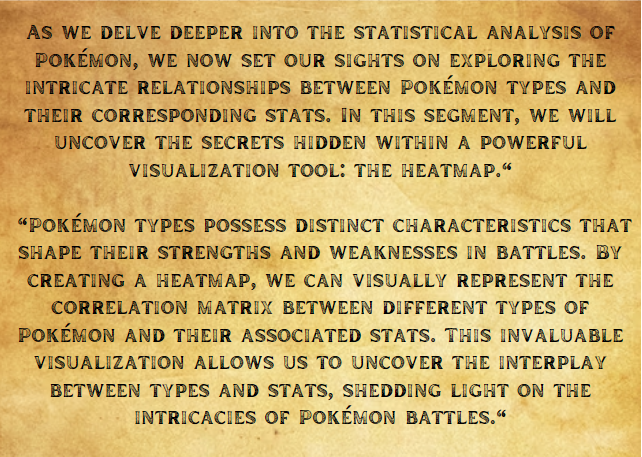 

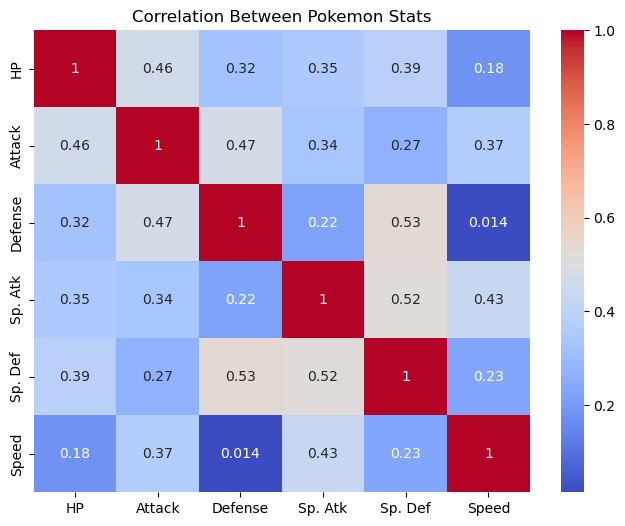

In [39]:
stats = ['HP', 'Attack', 'Defense', 'Sp. Atk', 'Sp. Def', 'Speed']
pokemon_stats = pokemon_data[stats]

# Create heatmap to visualize the correlation matrix
stat_correlation = pokemon_stats.corr()
plt.figure(figsize=(8, 6))
sns.heatmap(stat_correlation, annot=True, cmap='coolwarm')
plt.title('Correlation Between Pokemon Stats')
plt.show()

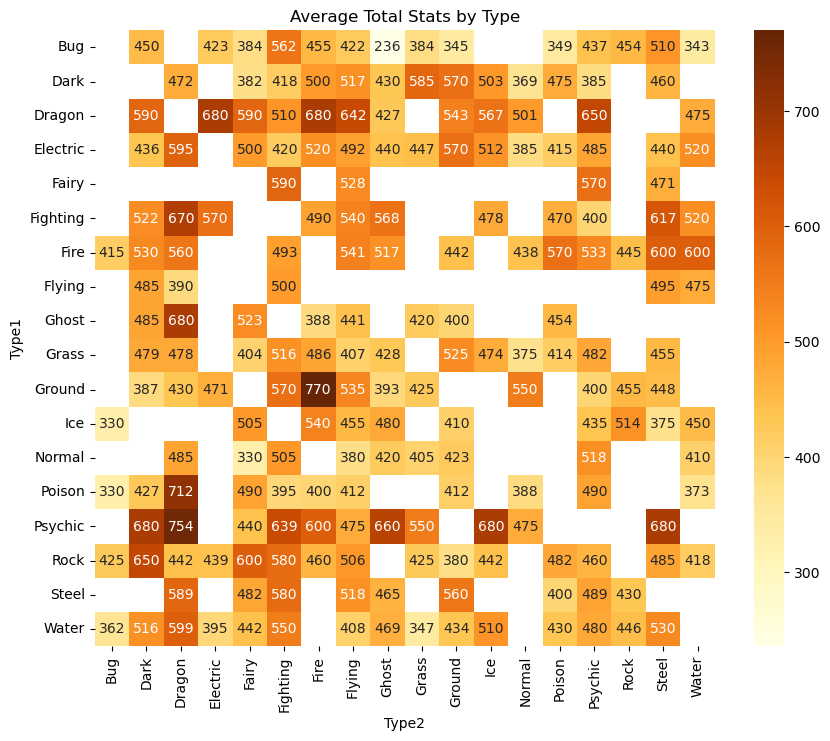

In [3]:
plt.figure(figsize=(10, 8))
total_stats_heatmap = pokemon_data.pivot_table(index='Type1', columns='Type2', values='Total', aggfunc='mean')
sns.heatmap(total_stats_heatmap, annot=True, fmt=".0f", cmap='YlOrBr')
plt.title('Average Total Stats by Type')
plt.show()

## Chapter 3: Comparative Pokémon Analysis

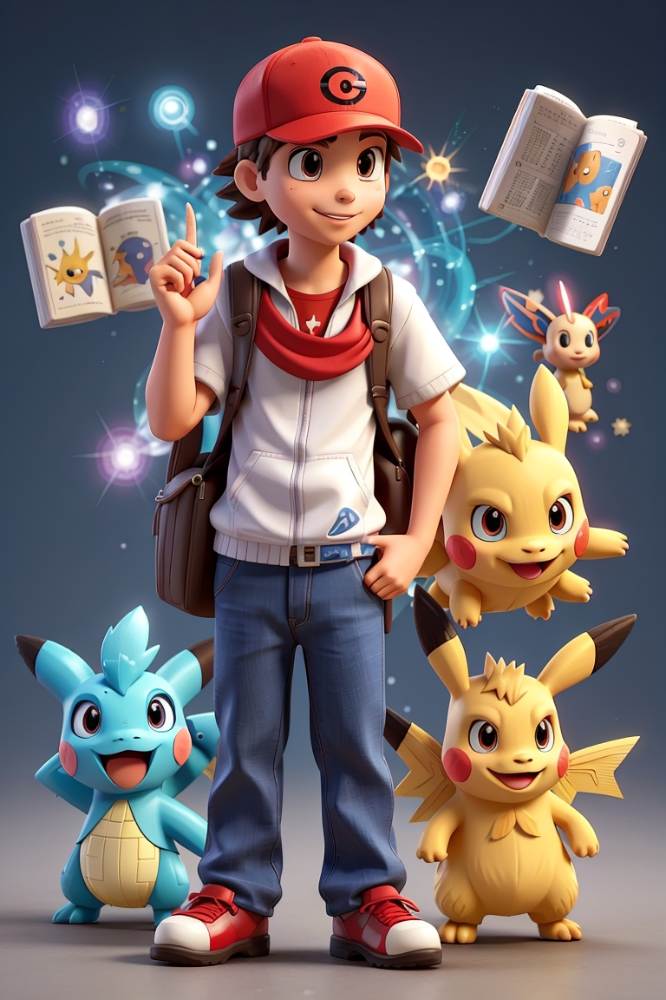

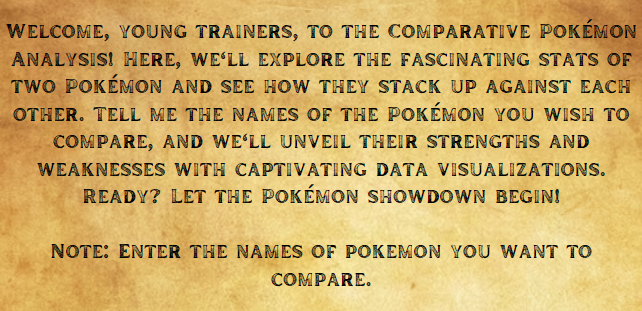

Please enter the name of the first Pokémon: pikachu
Please enter the name of the second Pokémon: Bulbasaur


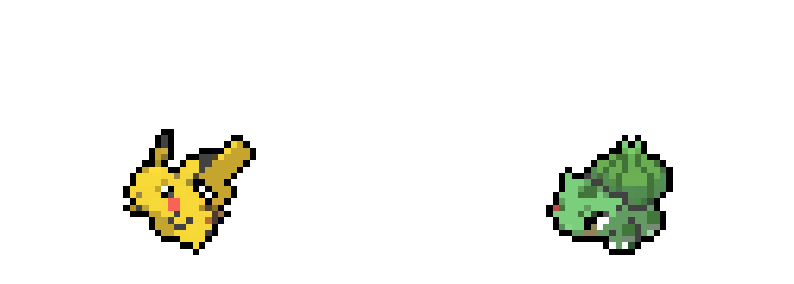

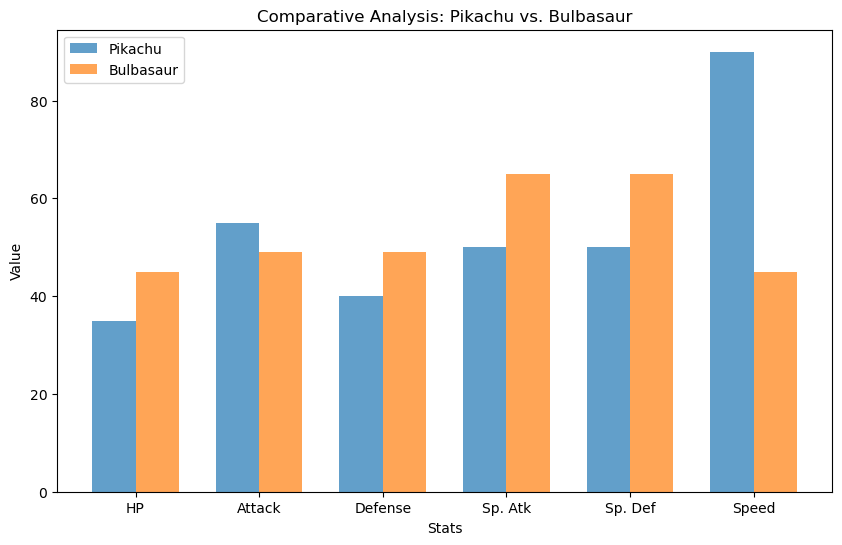

In [34]:


def compare_pokemon_stats(pokemon1_name, pokemon2_name):
    # Filter the dataset to find the two requested Pokémon
    pokemon1 = pokemon_data.loc[pokemon_data['Names'] == pokemon1_name.capitalize()]
    pokemon2 = pokemon_data.loc[pokemon_data['Names'] == pokemon2_name.capitalize()]

    # Check if both Pokémon are found in the dataset
    if pokemon1.empty or pokemon2.empty:
        print("Oops! One or both Pokémon not found.")
        return

    # Get the stats of each Pokémon
    stats = ['HP', 'Attack', 'Defense', 'Sp. Atk', 'Sp. Def', 'Speed']
    pokemon1_stats = pokemon1[stats].values[0]
    pokemon2_stats = pokemon2[stats].values[0]
    image_url1 = pokemon1['image_url'].values[0]
    image_url2 = pokemon2['image_url'].values[0]
    
    response1 = requests.get(image_url1)
    image1 = Image.open(BytesIO(response1.content))
    response2 = requests.get(image_url2)
    image2 = Image.open(BytesIO(response2.content))
    
    # Create a subplot grid with 1 row and 2 columns
    plt.figure(figsize=(10, 5))  # Adjust the figure size as needed
    plt.subplot(1, 2, 1)
    plt.imshow(image1)
    plt.axis('off')  # Turn off the axis ticks and labels for the first image

    plt.subplot(1, 2, 2)
    plt.imshow(image2)
    plt.axis('off')  # Turn off the axis ticks and labels for the second image

    plt.show()
    # Set the positions for the bars
    bar_width = 0.35
    x = np.arange(len(stats))

    # Create a bar chart to compare the stats of both Pokémon side by side
    plt.figure(figsize=(10, 6))
    plt.bar(x, pokemon1_stats, width=bar_width, label=pokemon1_name.capitalize(), alpha=0.7)
    plt.bar(x + bar_width, pokemon2_stats, width=bar_width, label=pokemon2_name.capitalize(), alpha=0.7)
    plt.xlabel('Stats')
    plt.ylabel('Value')
    plt.title(f'Comparative Analysis: {pokemon1_name.capitalize()} vs. {pokemon2_name.capitalize()}')
    plt.xticks(x + bar_width/2, stats)
    plt.legend()
    plt.show()

# Prompt the user for the names of the two Pokémon
pokemon1_name = input("Please enter the name of the first Pokémon: ")
pokemon2_name = input("Please enter the name of the second Pokémon: ")

# Perform the comparative analysis and display the bar chart
compare_pokemon_stats(pokemon1_name, pokemon2_name)


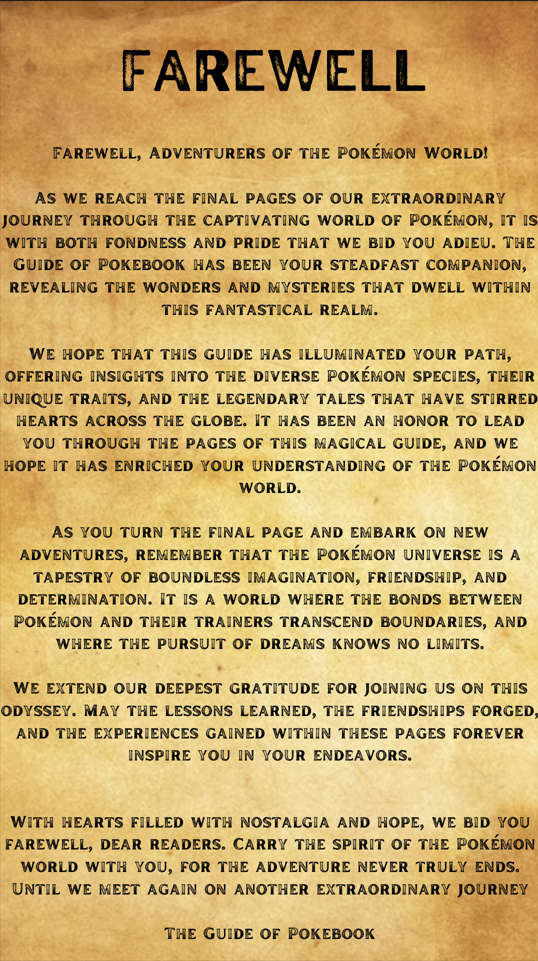

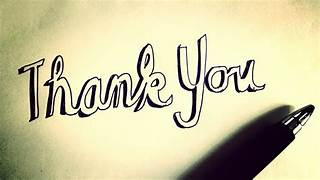